In [ ]:
A = matrix([[0, 1, -1], [-1, 0, 1], [1, -1, 0]])

In [ ]:
x = var('x')
H = A.charpoly()
H
# A.det()

x^3 + 3*x

In [ ]:
g = digraphs.RandomTournament(4)
g
A = g.adjacency_matrix()
K = A - A.transpose()
K
K.det()

1

In [ ]:
# for g in digraphs.tournaments_nauty(4):
#     print(g.edges(sort=True, labels = False))
tournaments = digraphs.tournaments_nauty
[len(list(tournaments(x))) for x in range(1, 9+1)]
# [len(list(tournaments(x, strongly_connected = True))) for x in range(1,9)]

[1, 1, 2, 4, 12, 56, 456, 6880, 191536]

In [ ]:
for n in range(1, 8+1):
    print("\n==================================================")
    print("degree n =", n, "with", len(list(digraphs.tournaments_nauty(n))), "non-isomorphic tournaments")
    charpoly_counts = {}
    for g in digraphs.tournaments_nauty(n):
        A = g.adjacency_matrix()
        K = A - A.transpose()
        H = K.charpoly()
        charpoly_counts[H] = charpoly_counts.get(H, 0) + 1
    print(f"degree n = {n} with {len(charpoly_counts)} distinct charpolys")
    for poly, count in charpoly_counts.items():
        print(f"charpoly: {poly}, count: {count}")
    seen_tuples = set()
    for poly in charpoly_counts:
        tup = tuple(c % 2 for c in poly.coefficients())
        if tup not in seen_tuples:
            print("coeffs mod 2:", tup)
            seen_tuples.add(tup)
    print("==================================================")


degree n = 1 with 1 non-isomorphic tournaments
degree n = 1 with 1 distinct charpolys
charpoly: x, count: 1
coeffs mod 2: (1,)

degree n = 2 with 1 non-isomorphic tournaments
degree n = 2 with 1 distinct charpolys
charpoly: x^2 + 1, count: 1
coeffs mod 2: (1, 1)

degree n = 3 with 2 non-isomorphic tournaments
degree n = 3 with 1 distinct charpolys
charpoly: x^3 + 3*x, count: 2
coeffs mod 2: (1, 1)

degree n = 4 with 4 non-isomorphic tournaments
degree n = 4 with 2 distinct charpolys
charpoly: x^4 + 6*x^2 + 1, count: 2
charpoly: x^4 + 6*x^2 + 9, count: 2
coeffs mod 2: (1, 0, 1)

degree n = 5 with 12 non-isomorphic tournaments
degree n = 5 with 2 distinct charpolys
charpoly: x^5 + 10*x^3 + 5*x, count: 4
charpoly: x^5 + 10*x^3 + 21*x, count: 8
coeffs mod 2: (1, 0, 1)

degree n = 6 with 56 non-isomorphic tournaments
degree n = 6 with 6 distinct charpolys
charpoly: x^6 + 15*x^4 + 15*x^2 + 1, count: 6
charpoly: x^6 + 15*x^4 + 39*x^2 + 9, count: 16
charpoly: x^6 + 15*x^4 + 47*x^2 + 1, count:

(1, 0, 0, 0, 1)


In [ ]:
g = digraphs.RandomTournament(6).relabel({v: v + 1 for v in range(6)}, inplace=False)
g
A = g.adjacency_matrix()
K = A - A.transpose()
K.det()

81

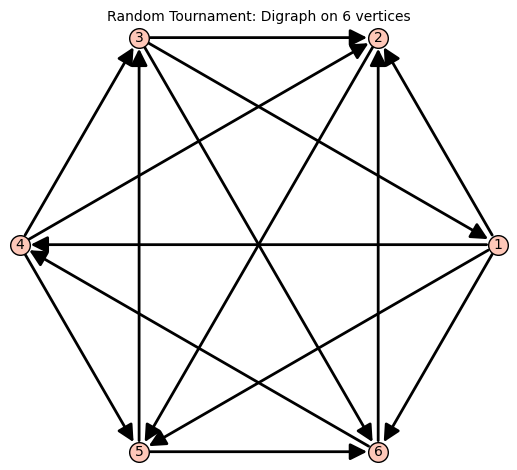

In [ ]:
# A = g.adjacency_matrix()
# K = A - A.transpose()
# K.det()
g

In [ ]:
(g.adjacency_matrix() - g.adjacency_matrix().transpose()).det()
g.all_simple_cycles()

[[1, 4, 3, 1],
 [1, 5, 3, 1],
 [2, 5, 3, 2],
 [2, 5, 6, 2],
 [3, 6, 4, 3],
 [4, 5, 6, 4],
 [1, 2, 5, 3, 1],
 [1, 4, 5, 3, 1],
 [1, 6, 4, 3, 1],
 [2, 5, 3, 6, 2],
 [2, 5, 6, 4, 2],
 [3, 6, 4, 5, 3],
 [1, 4, 2, 5, 3, 1],
 [1, 5, 6, 4, 3, 1],
 [1, 6, 2, 5, 3, 1],
 [1, 6, 4, 5, 3, 1],
 [2, 5, 3, 6, 4, 2],
 [2, 5, 6, 4, 3, 2],
 [1, 2, 5, 6, 4, 3, 1],
 [1, 6, 4, 2, 5, 3, 1]]

In [ ]:
from itertools import combinations, chain
import networkx as nx

def all_dcus(D):
    """Returns all disjoint cycle unions (DCUs) in the digraph D."""
    G_nx = D.networkx_graph()
    all_cycles = list(nx.simple_cycles(G_nx))
    
    # Filter subsets of disjoint cycles
    dcus = []
    for r in range(1, len(all_cycles)+1):
        for subset in combinations(all_cycles, r):
            flat = list(chain.from_iterable(subset))
            if len(flat) == len(set(flat)):  # disjoint
                dcus.append(subset)
    return dcus

def dcu_signature(gamma):
    """Compute sign and weight of a DCU gamma."""
    v_gamma = len(set(chain.from_iterable(gamma)))
    c_gamma = len(gamma)
    sgn = (-1) ** (v_gamma - c_gamma)
    weight = sgn * 2**v_gamma
    return weight

def skew_adj_matrix(D):
    A = D.adjacency_matrix()
    return A - A.transpose()


S = skew_adj_matrix(g)

# Compute determinant directly
det_S = S.determinant()

# Compute sum over DCUs
dcus = all_dcus(g)
sum_over_dcus = sum(dcu_signature(gamma) for gamma in dcus)+1

# Output
print("Tournament adjacency matrix:\n", g.adjacency_matrix())
print("Skew-adjacency matrix S:\n", S)
print("Determinant of S:", det_S)
print("Sum over DCUs:", sum_over_dcus)
print("Match:", det_S == sum_over_dcus)

Tournament adjacency matrix:
 [0 1 0 1 1 1]
[0 0 0 0 1 0]
[1 1 0 0 0 1]
[0 1 1 0 1 0]
[0 0 1 0 0 1]
[0 1 0 1 0 0]
Skew-adjacency matrix S:
 [ 0  1 -1  1  1  1]
[-1  0 -1 -1  1 -1]
[ 1  1  0 -1 -1  1]
[-1  1  1  0  1 -1]
[-1 -1  1 -1  0  1]
[-1  1 -1  1 -1  0]
Determinant of S: 81
Sum over DCUs: 81
Match: True


In [ ]:
for n in range(1, 6+1):
    print("\n==================================================")
    print("degree n =", n, "with", len(list(digraphs.tournaments_nauty(n))), "non-isomorphic tournaments")
    seen_charpolys = set()
    for g in digraphs.tournaments_nauty(n):
        A = g.adjacency_matrix()
        K = A - A.transpose()
        H = K.charpoly()
        # if H not in seen_charpolys:
        print(H)
        seen_charpolys.add(H)
    print(f"degree n = {n} with {len(seen_charpolys)}", "distinct charpolys")
    seen_tuples = set()
    for poly in seen_charpolys:
        tup = tuple(c % 2 for c in poly.coefficients())
        if tup not in seen_tuples:
            print("coeffs mod 2:", tup)
            seen_tuples.add(tup)
    print("==================================================")


degree n = 1 with 1 non-isomorphic tournaments
x
degree n = 1 with 1 distinct charpolys
coeffs mod 2: (1,)

degree n = 2 with 1 non-isomorphic tournaments
x^2 + 1
degree n = 2 with 1 distinct charpolys
coeffs mod 2: (1, 1)

degree n = 3 with 2 non-isomorphic tournaments
x^3 + 3*x
x^3 + 3*x
degree n = 3 with 1 distinct charpolys
coeffs mod 2: (1, 1)

degree n = 4 with 4 non-isomorphic tournaments
x^4 + 6*x^2 + 1
x^4 + 6*x^2 + 9
x^4 + 6*x^2 + 9
x^4 + 6*x^2 + 1
degree n = 4 with 2 distinct charpolys
coeffs mod 2: (1, 0, 1)

degree n = 5 with 12 non-isomorphic tournaments
x^5 + 10*x^3 + 5*x
x^5 + 10*x^3 + 21*x
x^5 + 10*x^3 + 21*x
x^5 + 10*x^3 + 5*x
x^5 + 10*x^3 + 21*x
x^5 + 10*x^3 + 21*x
x^5 + 10*x^3 + 5*x
x^5 + 10*x^3 + 5*x
x^5 + 10*x^3 + 21*x
x^5 + 10*x^3 + 21*x
x^5 + 10*x^3 + 21*x
x^5 + 10*x^3 + 21*x
degree n = 5 with 2 distinct charpolys
coeffs mod 2: (1, 0, 1)

degree n = 6 with 56 non-isomorphic tournaments
x^6 + 15*x^4 + 15*x^2 + 1
x^6 + 15*x^4 + 39*x^2 + 9
x^6 + 15*x^4 + 39*x^2 + 

In [ ]:
g = digraphs.TransitiveTournament(5)
A = g.adjacency_matrix()
K = A - A.transpose()
v = vector([1, -1, 1, -1, 1])
K * v

(0, 0, 0, 0, 0)

In [ ]:
for n in range(1, 10+1):
    g = digraphs.TransitiveTournament(n)
    K = g.adjacency_matrix() - g.adjacency_matrix().transpose()
    b = vector([(-1)^(i) for i in range(n)])
    print(f"\nn = {n}, b = {b}, K * b = {K * b}, sum = {sum(K * b)}")
    


n = 1, b = (1), K * b = (0), sum = 0

n = 2, b = (1, -1), K * b = (-1, -1), sum = -2

n = 3, b = (1, -1, 1), K * b = (0, 0, 0), sum = 0

n = 4, b = (1, -1, 1, -1), K * b = (-1, -1, -1, -1), sum = -4

n = 5, b = (1, -1, 1, -1, 1), K * b = (0, 0, 0, 0, 0), sum = 0

n = 6, b = (1, -1, 1, -1, 1, -1), K * b = (-1, -1, -1, -1, -1, -1), sum = -6

n = 7, b = (1, -1, 1, -1, 1, -1, 1), K * b = (0, 0, 0, 0, 0, 0, 0), sum = 0

n = 8, b = (1, -1, 1, -1, 1, -1, 1, -1), K * b = (-1, -1, -1, -1, -1, -1, -1, -1), sum = -8

n = 9, b = (1, -1, 1, -1, 1, -1, 1, -1, 1), K * b = (0, 0, 0, 0, 0, 0, 0, 0, 0), sum = 0

n = 10, b = (1, -1, 1, -1, 1, -1, 1, -1, 1, -1), K * b = (-1, -1, -1, -1, -1, -1, -1, -1, -1, -1), sum = -10


In [ ]:
for n in range(1, 20+1):
    g = digraphs.TransitiveTournament(n)
    K = g.adjacency_matrix() - g.adjacency_matrix().transpose()
    print(f"\nn = {n}, e-vals = {K.eigenvalues()}")


n = 1, e-vals = [0]

n = 2, e-vals = [-1*I, 1*I]

n = 3, e-vals = [0, -1.732050807568878?*I, 1.732050807568878?*I]

n = 4, e-vals = [-2.414213562373095?*I, -0.4142135623730951?*I, 0.4142135623730951?*I, 2.414213562373095?*I]

n = 5, e-vals = [0, -3.077683537175254?*I, -0.7265425280053608?*I, 0.7265425280053608?*I, 3.077683537175254?*I]

n = 6, e-vals = [-1*I, 1*I, -3.732050807568878?*I, -0.2679491924311227?*I, 0.2679491924311227?*I, 3.732050807568878?*I]

n = 7, e-vals = [0, -4.381286267534823?*I, -1.253960337662704?*I, -0.4815746188075287?*I, 0.4815746188075287?*I, 1.253960337662704?*I, 4.381286267534823?*I]

n = 8, e-vals = [-5.027339492125849?*I, -1.496605762665489?*I, -0.6681786379192989?*I, -0.1989123673796581?*I, 0.1989123673796581?*I, 0.6681786379192989?*I, 1.496605762665489?*I, 5.027339492125849?*I]

n = 9, e-vals = [0, -1.732050807568878?*I, 1.732050807568878?*I, -5.671281819617710?*I, -0.8390996311772800?*I, -0.3639702342662024?*I, 0.3639702342662024?*I, 0.8390996311772800?*

In [ ]:
for n in range(1, 20+1):
    g = digraphs.TransitiveTournament(n)
    K = g.adjacency_matrix() - g.adjacency_matrix().transpose()
    M = x*matrix.identity(n) - K
    print(f"\nn = {n}, Invertible? {M.is_invertible()}")


n = 1, Invertible? True

n = 2, Invertible? True

n = 3, Invertible? True

n = 4, Invertible? True

n = 5, Invertible? True

n = 6, Invertible? True

n = 7, Invertible? True

n = 8, Invertible? True

n = 9, Invertible? True

n = 10, Invertible? True

n = 11, Invertible? True

n = 12, Invertible? True

n = 13, Invertible? True

n = 14, Invertible? True

n = 15, Invertible? True


KeyboardInterrupt: ECL says: Console interrupt.

In [ ]:
from collections import defaultdict

n = 6
tournaments_6 = list(digraphs.tournaments_nauty(n))

# Function to compute the Seidel matrix of a tournament
def seidel_matrix(G):
    A = G.adjacency_matrix()
    return A - A.transpose()

# Group tournaments by characteristic polynomial of the Seidel matrix
charpoly_classes = defaultdict(list)

for T in tournaments_6:
    S = seidel_matrix(T)
    charpoly = S.charpoly()
    charpoly_classes[charpoly].append(T)

# Check switching equivalence: G1 is switching-equivalent to G2 iff
# G2 can be obtained from G1 by switching some subset of vertices
def is_switching_equivalent(G1, G2):
    V = G1.vertices()
    for subset in Subsets(V):
        H = G1.copy()
        for u in subset:
            for v in V:
                if u != v:
                    if H.has_edge(u,v):
                        H.delete_edge(u,v)
                        H.add_edge(v,u)
                    elif H.has_edge(v,u):
                        H.delete_edge(v,u)
                        H.add_edge(u,v)
        if H.is_isomorphic(G2):
            return True
    return False

# Find charpoly classes where not all graphs are switching-equivalent
for poly, graphs in charpoly_classes.items():
    if len(graphs) > 1:
        found = False
        for i in range(len(graphs)):
            for j in range(i+1, len(graphs)):
                if not is_switching_equivalent(graphs[i], graphs[j]):
                    print("Charpoly:", poly)
                    print(f"Graphs {i} and {j} are cospectral but not switching equivalent.")
                    print("G1:", graphs[i].adjacency_matrix())
                    print("G2:", graphs[j].adjacency_matrix())
                    found = True
                    break
            if found:
                break

In [ ]:
# ---- SWITCHING ----
def switching_operator(G, U):
    V = set(G.vertices())
    Uc = V.difference(U)
    H = G.copy()
    
    for u in U:
        for v in Uc: # For each vertex in U, switch with all vertices not in U
            if H.has_edge(u, v):
                H.delete_edge(u, v)
                H.add_edge(v, u)
            elif H.has_edge(v, u):
                H.delete_edge(v, u)
                H.add_edge(u, v)
    return H

def are_switching_equivalent(G1, G2):
    V = G1.vertices()
    for subset in Subsets(V):
        if switching_operator(G1, subset).is_isomorphic(G2):
            return True
    return False

In [ ]:
T1 = digraphs.Circuit(3)
T2 = digraphs.TransitiveTournament(3)
print("T1 is switching equivalent to T2:", are_switching_equivalent(T1, T2))

T1 is switching equivalent to T2: True


In [ ]:
from collections import defaultdict

n = 6
def seidel_matrix(T):
    A = T.adjacency_matrix()
    return A - A.transpose()

# ---- SWITCHING ----
def switching_operator(G, U):
    V = set(G.vertices())
    Uc = V.difference(U)
    H = G.copy()
    
    for u in U:
        for v in Uc:
            if H.has_edge(u, v):
                H.delete_edge(u, v)
                H.add_edge(v, u)
            elif H.has_edge(v, u):
                H.delete_edge(v, u)
                H.add_edge(u, v)
    return H

def are_switching_equivalent(G1, G2):
    V = G1.vertices()
    for subset in Subsets(V):
        if switching_operator(G1, subset).is_isomorphic(G2):
            return True
    return False



tourns = list(digraphs.tournaments_nauty(n))
print(f"Generated {len(tourns)} non-isomorphic tournaments of order {n}.")

# Group tournaments by characteristic polynomial of Seidel matrix
charpoly_classes = defaultdict(list)
for T in tourns:
    poly = seidel_matrix(T).charpoly()
    charpoly_classes[poly].append(T)

print(f"Found {len(charpoly_classes)} distinct characteristic polynomials.\n")

# Search for cospectral but non-switching-equivalent pairs
for poly, Ts in charpoly_classes.items():
    k = len(Ts)
    if k > 1:
        for i in range(k):
            for j in range(i + 1, k):
                if not are_switching_equivalent(Ts[i], Ts[j]):
                    print(f"⚠️  Found cospectral non-switching-equivalent pair in class of size {k}:")
                    print(f"CharPoly: {poly}")
                    print(f"Pair indices: {i}, {j}")
                    print("Adjacency matrix T1:")
                    print(Ts[i].adjacency_matrix())
                    print("Adjacency matrix T2:")
                    print(Ts[j].adjacency_matrix())
                    break  # Stop after first such pair per class
            else:
                continue
            break

Generated 56 non-isomorphic tournaments of order 6.
Found 6 distinct characteristic polynomials.



In [ ]:
from collections import defaultdict

n = 6
target_poly = polygen(QQ).parent()(x^6 + 15*x^4 + 15*x^2 + 1)

# Seidel matrix: A - A^T
def seidel_matrix(T):
    A = T.adjacency_matrix()
    return A - A.transpose()

# Switching operator
def switching_operator(G, U):
    V = set(G.vertices())
    Uc = V.difference(U)
    H = G.copy()
    for u in U:
        for v in Uc:
            if H.has_edge(u, v):
                H.delete_edge(u, v)
                H.add_edge(v, u)
            elif H.has_edge(v, u):
                H.delete_edge(v, u)
                H.add_edge(u, v)
    return H

# Find a switching set U so that phi_U(G1) ≅ G2
def find_switching_set(G1, G2):
    V = G1.vertices()
    for subset in Subsets(V):
        if switching_operator(G1, subset).is_isomorphic(G2):
            return subset
    return None

# Get all tournaments with matching characteristic polynomial
tourns = list(digraphs.tournaments_nauty(n))
matching_tourns = [T for T in tourns if seidel_matrix(T).charpoly() == target_poly]
num = len(matching_tourns)

print(f"Found {num} tournaments with charpoly {target_poly}.")

# Check all pairs (i, j) for switching equivalence
all_equiv = True
switching_map = {}

for i in range(num):
    for j in range(num):
        if i == j:
            continue
        U = find_switching_set(matching_tourns[i], matching_tourns[j])
        if U is None:
            print(f" Tournaments {i} and {j} are NOT switching equivalent.")
            all_equiv = False
        else:
            switching_map[(i, j)] = U

# Step 3: Output results
if all_equiv:
    print("\n All 6 tournaments are mutually switching equivalent.\n")
    for i in range(num):
        print(f"--- Tournament {i} ---")
        print(matching_tourns[i].adjacency_matrix())
        for j in range(num):
            if i != j:
                print(f"  Switch to Tournament {j} with subset: {sorted(switching_map[(i,j)])}")
        print()
else:
    print("\n Not all tournaments are in the same switching class.")

Found 6 tournaments with charpoly x^6 + 15*x^4 + 15*x^2 + 1.

✅ All 6 tournaments are mutually switching equivalent.

--- Tournament 0 ---
[0 0 0 0 0 0]
[1 0 0 0 0 0]
[1 1 0 0 0 0]
[1 1 1 0 0 0]
[1 1 1 1 0 0]
[1 1 1 1 1 0]
  Switch to Tournament 1 with subset: [3]
  Switch to Tournament 2 with subset: [1]
  Switch to Tournament 3 with subset: [2]
  Switch to Tournament 4 with subset: [2, 3]
  Switch to Tournament 5 with subset: [1, 3]

--- Tournament 1 ---
[0 0 0 0 1 1]
[1 0 0 0 0 0]
[1 1 0 0 0 0]
[1 1 1 0 0 0]
[0 1 1 1 0 0]
[0 1 1 1 1 0]
  Switch to Tournament 0 with subset: [0]
  Switch to Tournament 2 with subset: [5]
  Switch to Tournament 3 with subset: [1]
  Switch to Tournament 4 with subset: [3]
  Switch to Tournament 5 with subset: [2]

--- Tournament 2 ---
[0 0 0 0 1 0]
[1 0 0 0 0 0]
[1 1 0 0 0 0]
[1 1 1 0 0 0]
[0 1 1 1 0 1]
[1 1 1 1 0 0]
  Switch to Tournament 0 with subset: [0]
  Switch to Tournament 1 with subset: [1]
  Switch to Tournament 3 with subset: [5]
  Switch to T

In [ ]:
print("T0 is switching equivalent to T1:", are_switching_equivalent(matching_tourns[0], matching_tourns[1]))

T0 is switching equivalent to T1: True


In [ ]:
from collections import defaultdict
# from sage.all import *

n = 6
x = polygen(QQ)
target_poly = x^6 + 15*x^4 + 15*x^2 + 1


def seidel_matrix(T):
    A = T.adjacency_matrix()
    return A - A.transpose()

# Switching operator
def switching_operator(G, U):
    V = set(G.vertices())
    Uc = V.difference(U)
    H = G.copy()
    for u in U:
        for v in Uc:
            if H.has_edge(u, v):
                H.delete_edge(u, v)
                H.add_edge(v, u)
            elif H.has_edge(v, u):
                H.delete_edge(v, u)
                H.add_edge(u, v)
    return H

def find_switching_set(G1, G2):
    V = G1.vertices()
    for subset in Subsets(V):
        switched = switching_operator(G1, subset)
        is_iso, mapping = switched.is_isomorphic(G2, certificate=True)
        if is_iso:
            return subset, mapping
    return None, None

# Get all tournaments with matching characteristic polynomial
tourns = list(digraphs.tournaments_nauty(n))
matching_tourns = [T for T in tourns if seidel_matrix(T).charpoly() == target_poly]
num = len(matching_tourns)

print(f"Found {num} tournaments with charpoly {target_poly}.\n")

# Check all pairs (i, j) for switching equivalence
all_equiv = True
switching_map = {}
switched_matrices = {}
isomorphisms = {}

for i in range(num):
    for j in range(num):
        if i == j:
            continue
        U, mapping = find_switching_set(matching_tourns[i], matching_tourns[j])
        if U is None:
            print(f" Tournaments {i} and {j} are NOT switching equivalent.")
            all_equiv = False
        else:
            switching_map[(i, j)] = U
            switched = switching_operator(matching_tourns[i], U)
            switched_matrices[(i, j)] = switched.adjacency_matrix()
            isomorphisms[(i, j)] = mapping

# Output 
if all_equiv:
    print("\n All tournaments are mutually switching equivalent.\n")
    for i in range(num):
        print(f"--- Tournament {i} ---")
        print(matching_tourns[i].adjacency_matrix())
        for j in range(num):
            if i != j:
                U = switching_map[(i, j)]
                matrix = switched_matrices[(i, j)]
                mapping = isomorphisms[(i, j)]
                print(f"\n  Switching to Tournament {j} using subset {sorted(U)}:")
                print(matrix)
                print("  Isomorphism mapping:")
                for k in sorted(mapping.keys()):
                    print(f"    {k} → {mapping[k]}")
        print()
else:
    print("\n Not all tournaments are in the same switching class.")

Found 6 tournaments with charpoly x^6 + 15*x^4 + 15*x^2 + 1.


 All tournaments are mutually switching equivalent.

--- Tournament 0 ---
[0 0 0 0 0 0]
[1 0 0 0 0 0]
[1 1 0 0 0 0]
[1 1 1 0 0 0]
[1 1 1 1 0 0]
[1 1 1 1 1 0]

  Switching to Tournament 1 using subset [3]:
[0 0 0 1 0 0]
[1 0 0 1 0 0]
[1 1 0 1 0 0]
[0 0 0 0 1 1]
[1 1 1 0 0 0]
[1 1 1 0 1 0]
  Isomorphism mapping:
    0 → 1
    1 → 2
    2 → 3
    3 → 0
    4 → 4
    5 → 5

  Switching to Tournament 2 using subset [1]:
[0 1 0 0 0 0]
[0 0 1 1 1 1]
[1 0 0 0 0 0]
[1 0 1 0 0 0]
[1 0 1 1 0 0]
[1 0 1 1 1 0]
  Isomorphism mapping:
    0 → 0
    1 → 4
    2 → 1
    3 → 2
    4 → 3
    5 → 5

  Switching to Tournament 3 using subset [2]:
[0 0 1 0 0 0]
[1 0 1 0 0 0]
[0 0 0 1 1 1]
[1 1 0 0 0 0]
[1 1 0 1 0 0]
[1 1 0 1 1 0]
  Isomorphism mapping:
    0 → 1
    1 → 2
    2 → 0
    3 → 3
    4 → 4
    5 → 5

  Switching to Tournament 4 using subset [2, 3]:
[0 0 1 1 0 0]
[1 0 1 1 0 0]
[0 0 0 0 1 1]
[0 0 1 0 1 1]
[1 1 0 0 0 0]
[1 1 0 0 1 0]
  I

In [ ]:
from collections import defaultdict

n = 7
x = polygen(QQ)

# Seidel matrix: A - A^T
def seidel_matrix(T):
    A = T.adjacency_matrix()
    return A - A.transpose()

# Switching operator
def switching_operator(G, U):
    V = set(G.vertices())
    Uc = V.difference(U)
    H = G.copy()
    for u in U:
        for v in Uc:
            if H.has_edge(u, v):
                H.delete_edge(u, v)
                H.add_edge(v, u)
            elif H.has_edge(v, u):
                H.delete_edge(v, u)
                H.add_edge(u, v)
    return H

# Find switching set and isomorphism map from G1 to G2
def find_switching_set(G1, G2):
    V = G1.vertices()
    for subset in Subsets(V):
        switched = switching_operator(G1, subset)
        is_iso, mapping = switched.is_isomorphic(G2, certificate=True)
        if is_iso:
            return subset, mapping
    return None, None

# Generate all tournaments and group by Seidel charpoly
tourns = list(digraphs.tournaments_nauty(n))
poly_classes = defaultdict(list)

for T in tourns:
    p = seidel_matrix(T).charpoly()
    poly_classes[p].append(T)

#
for idx, (poly, class_tourns) in enumerate(poly_classes.items(), 1):
    num = len(class_tourns)
    print(f"\n### Charpoly Class {idx} ###")
    print(f"Characteristic Polynomial: {poly}")
    print(f"Number of tournaments: {num}")

    if num == 1:
        print("Only one tournament - trivially switching equivalent.\n")
        continue

    all_equiv = True
    switching_map = {}
    switched_matrices = {}
    isomorphisms = {}

    for i in range(num):
        for j in range(num):
            if i == j:
                continue
            U, mapping = find_switching_set(class_tourns[i], class_tourns[j])
            if U is None:
                print(f"Tournaments {i} and {j} are NOT switching equivalent.")
                all_equiv = False
            else:
                switching_map[(i, j)] = U
                switched = switching_operator(class_tourns[i], U)
                switched_matrices[(i, j)] = switched.adjacency_matrix()
                isomorphisms[(i, j)] = mapping

    if all_equiv:
        print("All tournaments in this class are mutually switching equivalent.\n")
        for i in range(num):
            print(f"--- Tournament {i} ---")
            print(class_tourns[i].adjacency_matrix())
            for j in range(num):
                if i != j:
                    U = switching_map[(i, j)]
                    matrix = switched_matrices[(i, j)]
                    mapping = isomorphisms[(i, j)]
                    print(f"\n   Switch to Tournament {j} using subset {sorted(U)}:")
                    print(matrix)
                    print("  Isomorphism mapping:")
                    for k in sorted(mapping.keys()):
                        print(f"    {k} → {mapping[k]}")
            print()
    else:
        print("Not all tournaments in this class are switching equivalent.")


### Charpoly Class 1 ###
Characteristic Polynomial: x^8 + 28*x^6 + 70*x^4 + 28*x^2 + 1
Number of tournaments: 16
All tournaments in this class are mutually switching equivalent.

--- Tournament 0 ---
[0 0 0 0 0 0 0 0]
[1 0 0 0 0 0 0 0]
[1 1 0 0 0 0 0 0]
[1 1 1 0 0 0 0 0]
[1 1 1 1 0 0 0 0]
[1 1 1 1 1 0 0 0]
[1 1 1 1 1 1 0 0]
[1 1 1 1 1 1 1 0]

   Switch to Tournament 1 using subset [5]:
[0 0 0 0 0 1 0 0]
[1 0 0 0 0 1 0 0]
[1 1 0 0 0 1 0 0]
[1 1 1 0 0 1 0 0]
[1 1 1 1 0 1 0 0]
[0 0 0 0 0 0 1 1]
[1 1 1 1 1 0 0 0]
[1 1 1 1 1 0 1 0]
  Isomorphism mapping:
    0 → 1
    1 → 2
    2 → 3
    3 → 4
    4 → 5
    5 → 0
    6 → 6
    7 → 7

   Switch to Tournament 2 using subset [1]:
[0 1 0 0 0 0 0 0]
[0 0 1 1 1 1 1 1]
[1 0 0 0 0 0 0 0]
[1 0 1 0 0 0 0 0]
[1 0 1 1 0 0 0 0]
[1 0 1 1 1 0 0 0]
[1 0 1 1 1 1 0 0]
[1 0 1 1 1 1 1 0]
  Isomorphism mapping:
    0 → 0
    1 → 6
    2 → 1
    3 → 2
    4 → 3
    5 → 4
    6 → 5
    7 → 7

   Switch to Tournament 3 using subset [4]:
[0 0 0 0 1 0 0 0]
[1 0 0 0

In [ ]:
from collections import defaultdict
from sage.all import *

# --- Logging setup ---
import sys

class Tee:
    def __init__(self, *files):
        self.files = files

    def write(self, obj):
        for f in self.files:
            f.write(obj)
            f.flush()

    def flush(self):
        for f in self.files:
            f.flush()

logfile = open("tournament_output.txt", "w")
sys.stdout = Tee(sys.stdout, logfile)

# --- Parameters ---
n = 7
x = polygen(QQ)

# --- Seidel matrix: A - A^T ---
def seidel_matrix(T):
    A = T.adjacency_matrix()
    return A - A.transpose()

# --- Switching operator ---
def switching_operator(G, U):
    V = set(G.vertices())
    Uc = V.difference(U)
    H = G.copy()
    for u in U:
        for v in Uc:
            if H.has_edge(u, v):
                H.delete_edge(u, v)
                H.add_edge(v, u)
            elif H.has_edge(v, u):
                H.delete_edge(v, u)
                H.add_edge(u, v)
    return H

# --- Find switching set and isomorphism map from G1 to G2 ---
def find_switching_set(G1, G2):
    V = G1.vertices()
    for subset in Subsets(V):
        switched = switching_operator(G1, subset)
        is_iso, mapping = switched.is_isomorphic(G2, certificate=True)
        if is_iso:
            return subset, mapping
    return None, None

# --- Generate all tournaments and group by Seidel charpoly ---
tourns = list(digraphs.tournaments_nauty(n))
poly_classes = defaultdict(list)

for T in tourns:
    p = seidel_matrix(T).charpoly()
    poly_classes[p].append(T)

# --- Analyze each class ---
for idx, (poly, class_tourns) in enumerate(poly_classes.items(), 1):
    num = len(class_tourns)
    print(f"\n### Charpoly Class {idx} ###")
    print(f"Characteristic Polynomial: {poly}")
    print(f"Number of tournaments: {num}")

    if num == 1:
        print("Only one tournament - trivially switching equivalent.\n")
        continue

    all_equiv = True
    switching_map = {}
    switched_matrices = {}
    isomorphisms = {}

    for i in range(num):
        for j in range(num):
            if i == j:
                continue
            U, mapping = find_switching_set(class_tourns[i], class_tourns[j])
            if U is None:
                print(f"Tournaments {i} and {j} are NOT switching equivalent.")
                all_equiv = False
            else:
                switching_map[(i, j)] = U
                switched = switching_operator(class_tourns[i], U)
                switched_matrices[(i, j)] = switched.adjacency_matrix()
                isomorphisms[(i, j)] = mapping

    if all_equiv:
        print("All tournaments in this class are mutually switching equivalent.\n")
        for i in range(num):
            print(f"--- Tournament {i} ---")
            print(class_tourns[i].adjacency_matrix())
            for j in range(num):
                if i != j:
                    U = switching_map[(i, j)]
                    matrix = switched_matrices[(i, j)]
                    mapping = isomorphisms[(i, j)]
                    print(f"\n   Switch to Tournament {j} using subset {sorted(U)}:")
                    print(matrix)
                    print("  Isomorphism mapping:")
                    for k in sorted(mapping.keys()):
                        print(f"    {k} → {mapping[k]}")
            print()
    else:
        print("Not all tournaments in this class are switching equivalent.")

# --- Cleanup ---
logfile.close()


### Charpoly Class 1 ###
Characteristic Polynomial: x^7 + 21*x^5 + 35*x^3 + 7*x
Number of tournaments: 10
All tournaments in this class are mutually switching equivalent.

--- Tournament 0 ---
[0 0 0 0 0 0 0]
[1 0 0 0 0 0 0]
[1 1 0 0 0 0 0]
[1 1 1 0 0 0 0]
[1 1 1 1 0 0 0]
[1 1 1 1 1 0 0]
[1 1 1 1 1 1 0]

   Switch to Tournament 1 using subset [4]:
[0 0 0 0 1 0 0]
[1 0 0 0 1 0 0]
[1 1 0 0 1 0 0]
[1 1 1 0 1 0 0]
[0 0 0 0 0 1 1]
[1 1 1 1 0 0 0]
[1 1 1 1 0 1 0]
  Isomorphism mapping:
    0 → 1
    1 → 2
    2 → 3
    3 → 4
    4 → 0
    5 → 5
    6 → 6

   Switch to Tournament 2 using subset [1]:
[0 1 0 0 0 0 0]
[0 0 1 1 1 1 1]
[1 0 0 0 0 0 0]
[1 0 1 0 0 0 0]
[1 0 1 1 0 0 0]
[1 0 1 1 1 0 0]
[1 0 1 1 1 1 0]
  Isomorphism mapping:
    0 → 0
    1 → 5
    2 → 1
    3 → 2
    4 → 3
    5 → 4
    6 → 6

   Switch to Tournament 3 using subset [3]:
[0 0 0 1 0 0 0]
[1 0 0 1 0 0 0]
[1 1 0 1 0 0 0]
[0 0 0 0 1 1 1]
[1 1 1 0 0 0 0]
[1 1 1 0 1 0 0]
[1 1 1 0 1 1 0]
  Isomorphism mapping:
    0 → 1
    

In [ ]:
from collections import defaultdict
from sage.all import *

import sys
import os

# Create output directory
output_dir = "tournament_outputs"
os.makedirs(output_dir, exist_ok=True)

# --- Seidel matrix: A - A^T ---
def seidel_matrix(T):
    A = T.adjacency_matrix()
    return A - A.transpose()

# --- Switching operator ---
def switching_operator(G, U):
    V = set(G.vertices())
    Uc = V.difference(U)
    H = G.copy()
    for u in U:
        for v in Uc:
            if H.has_edge(u, v):
                H.delete_edge(u, v)
                H.add_edge(v, u)
            elif H.has_edge(v, u):
                H.delete_edge(v, u)
                H.add_edge(u, v)
    return H

# --- Find switching set and isomorphism map from G1 to G2 ---
def find_switching_set(G1, G2):
    V = G1.vertices()
    for subset in Subsets(V):
        switched = switching_operator(G1, subset)
        is_iso, mapping = switched.is_isomorphic(G2, certificate=True)
        if is_iso:
            return subset, mapping
    return None, None

# --- Main loop over n = 1 to 50 ---
for n in range(1, 50+1):
    filename = os.path.join(output_dir, f"tournaments_n_{n}.txt")
    with open(filename, "w") as logfile:

        class Tee:
            def __init__(self, *files):
                self.files = files
            def write(self, obj):
                for f in self.files:
                    f.write(obj)
                    f.flush()
            def flush(self):
                for f in self.files:
                    f.flush()

        sys.stdout = Tee(sys.__stdout__, logfile)

        print(f"\n================= Order n = {n} =================\n")
        tourns = list(digraphs.tournaments_nauty(n))
        poly_classes = defaultdict(list)

        for T in tourns:
            p = seidel_matrix(T).charpoly()
            poly_classes[p].append(T)

        for idx, (poly, class_tourns) in enumerate(poly_classes.items(), 1):
            num = len(class_tourns)
            print(f"\n### Charpoly Class {idx} ###")
            print(f"Characteristic Polynomial: {poly}")
            print(f"Number of tournaments: {num}")

            if num == 1:
                print("Only one tournament - trivially switching equivalent.\n")
                continue

            all_equiv = True
            switching_map = {}
            switched_matrices = {}
            isomorphisms = {}

            for i in range(num):
                for j in range(num):
                    if i == j:
                        continue
                    U, mapping = find_switching_set(class_tourns[i], class_tourns[j])
                    if U is None:
                        print(f"Tournaments {i} and {j} are NOT switching equivalent.")
                        all_equiv = False
                    else:
                        switching_map[(i, j)] = U
                        switched = switching_operator(class_tourns[i], U)
                        switched_matrices[(i, j)] = switched.adjacency_matrix()
                        isomorphisms[(i, j)] = mapping

            if all_equiv:
                print("All tournaments in this class are mutually switching equivalent.\n")
                for i in range(num):
                    print(f"--- Tournament {i} ---")
                    print(class_tourns[i].adjacency_matrix())
                    for j in range(num):
                        if i != j:
                            U = switching_map[(i, j)]
                            matrix = switched_matrices[(i, j)]
                            mapping = isomorphisms[(i, j)]
                            print(f"\n   Switch to Tournament {j} using subset {sorted(U)}:")
                            print(matrix)
                            print("  Isomorphism mapping:")
                            for k in sorted(mapping.keys()):
                                print(f"    {k} → {mapping[k]}")
                    print()
            else:
                print("Not all tournaments in this class are switching equivalent.")

# Restore standard output
sys.stdout = sys.__stdout__